# Evaluate different CNN models over MPI and Era

This notebook evaluates different CNN autoencoder models on things like 1) monthly averages and 2) climate. The selected model tries to bias correct Mpi to Era and Era to MPI.

### TOC
 [1. Model Select](#ms)<br>
 [2. Load data](#ld)<br>
 [3. Month averages](#ma)<br>
 [4. Single day bias](#sd)<br>
 [5. Single filter activations](#sfa)<br>
 [6. VGG16 approxiamtion](#vgg16)<br>
 [7. SSIM](#ssim)<br>
 





In [2]:
from IPython import display

import numpy as np
import torch
from torch import nn
from torch.optim import Adam
from torch.autograd import Variable

import cv2
#from skimage.metrics import structural_similarity as ssim
import copy


In [3]:
# load netcdf files directly via xarray
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy


In [4]:
# define internal pic res
ires = 128
res = 128
nvars = 16
mnvars = 16


In [5]:
 mnvars

16

<a id='ms'></a>
## Models: run one from below:


In [6]:
import torch.nn.functional as F

In [16]:
# MODEL: vgg16
import torch.nn as nn
import torch.utils.model_zoo as model_zoo
import math


__all__ = [
    'VGG', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn',
    'vgg19_bn', 'vgg19',
]


model_urls = {
    'vgg11': 'https://download.pytorch.org/models/vgg11-bbd30ac9.pth',
    'vgg13': 'https://download.pytorch.org/models/vgg13-c768596a.pth',
    'vgg16': 'https://download.pytorch.org/models/vgg16-397923af.pth',
    'vgg19': 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth',
    'vgg11_bn': 'https://download.pytorch.org/models/vgg11_bn-6002323d.pth',
    'vgg13_bn': 'https://download.pytorch.org/models/vgg13_bn-abd245e5.pth',
    'vgg16_bn': 'https://download.pytorch.org/models/vgg16_bn-6c64b313.pth',
    'vgg19_bn': 'https://download.pytorch.org/models/vgg19_bn-c79401a0.pth',
}


class VGG(nn.Module):

    def __init__(self, features, num_classes=1000):
        super(VGG, self).__init__()
        self.features = features
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )
        self._initialize_weights()

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
                if m.bias is not None:
                    m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()
            elif isinstance(m, nn.Linear):
                m.weight.data.normal_(0, 0.01)
                m.bias.data.zero_()


def make_layers(cfg, batch_norm=False):
    layers = []
    in_channels = 3
    for v in cfg:
        if v == 'M':
            layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        else:
            conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = v
    return nn.Sequential(*layers)


cfg = {
    'A': [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M'],
    'B': [64, 64, 'M', 128, 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M'],
    'D': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512, 'M', 512, 512, 512, 'M'],
    'E': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 256, 'M', 512, 512, 512, 512, 'M', 512, 512, 512, 512, 'M'],
}

def vgg16(pretrained=False, **kwargs):
    """VGG 16-layer model (configuration "D")

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = VGG(make_layers(cfg['D']), **kwargs)
    if pretrained:
        model.load_state_dict(model_zoo.load_url(model_urls['vgg16']))
    return model



class GenerativeNet2(torch.nn.Module):
    def __init__(self):
        super(GenerativeNet2, self).__init__()

        self.linear = nn.Sequential(
          nn.Linear(1000, 2048*4*4),
          nn.LeakyReLU(0.2, inplace=True)
        )

        self.conv1 = nn.Sequential(
            nn.BatchNorm2d(2048),
            nn.ConvTranspose2d(
                in_channels=2048, out_channels=1024, kernel_size=4,
                stride=2, padding=1, bias=True
            ),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.BatchNorm2d(1024),
            nn.ConvTranspose2d(
                in_channels=1024, out_channels=512, kernel_size=4,
                stride=2, padding=1, bias=True
            ),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.BatchNorm2d(512),
            nn.ConvTranspose2d(
                in_channels=512, out_channels=256, kernel_size=4,
                stride=2, padding=1, bias=True
            ),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv4 = nn.Sequential(
            nn.BatchNorm2d(256),
            nn.ConvTranspose2d(
                in_channels=256, out_channels=128, kernel_size=4,
                stride=2, padding=1, bias=True
            ),
            nn.LeakyReLU(0.2, inplace=True)
        )


        self.conv5 = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.ConvTranspose2d(
                in_channels=128, out_channels=mnvars, kernel_size=4,
                stride=2, padding=1, bias=True
            ),
            #nn.BatchNorm2d(512),
            #nn.LeakyReLU(0.2, inplace=True)
            nn.Sigmoid() # constrain output to 0-1 b/c SSIM does not like them
        )
        
    def forward(self, x):

        #m = nn.Dropout(p=0.75)
        #x = m(x)

        # Convolutional layers
        #print(x.shape)
        x = self.linear(x)
        x = x.view(-1, 2048,4,4)
        x = self.conv1(x)
        #print(x.shape)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)

        ## Flatten and apply sigmoid
        #x = x.view(-1, 2048*4*4)
        #x = self.out(x)
        return x

# Create Network instances 
#import torchvision.models as models
general_encoder = vgg16()

# customize vgg16()
general_encoder.features[0] = nn.Conv2d(16, 64, 3, 1, 1)
#general_encoder.features[0] = nn.ConvTranspose2d(16, 64, 14, 2, 0)
def add_module(self,module):
    self.add_module(str(len(self) + 1 ), module)
torch.nn.Module.add = add_module
general_encoder.features.add(nn.AdaptiveAvgPool2d(output_size=(7, 7)))


vgg_decoder = GenerativeNet2()

# general encoder
gstate = torch.load("/glade/scratch/dkorytin/saved_models/vgg16-eraandmpi-with-doy-cuda_generator-e200", map_location=torch.device('cpu'))
general_encoder.load_state_dict(gstate['generator'])
general_encoder.eval()
minmaxi_era = np.array(gstate['minmaxi_era'])

minmaxi_mpi = minmaxi_era    # same normalization scale

# vgg16 decoder
vgg_decoder.load_state_dict(gstate['generator2'])
vgg_decoder.eval()



GenerativeNet2(
  (linear): Sequential(
    (0): Linear(in_features=1000, out_features=32768, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv1): Sequential(
    (0): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): ConvTranspose2d(2048, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv2): Sequential(
    (0): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv3): Sequential(
    (0): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv4): Sequential(
    (0): BatchNorm2d(256, eps=1e-05, momen

In [17]:
general_encoder.parameters

<bound method Module.parameters of VGG(
  (features): Sequential(
    (0): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_siz

<a id='ld'></a>
# Load data

In [9]:
###################################
## LOAD MPI UATM + Surface: hist ##
###################################
def load_mpi_hist():
    global samples,mdv1,mdv2,mdv3,mdv4,mdv5,mdv6,mdv7,mdv8,mdv9,mdv10,mdv11,mdv12,mdv13,mdv14,mdv15,mdv16,mnvars
    
    mnvars = 16
        
    ########### LOAd MPI ############
    mstart = 0

    mndays = 20454       # 1950-2005

    #ncks -O -d lat,23.375,55.125 -d lon,-112.375,-80.625 $f $of
    #ncatted -a missing_value,$v,o,f,0.0 -a _FillValue,$v,o,f,0.0 $of
    d='/glade/p/ral/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/historical/'

    tslice = slice('1979-01-01T00:00:00', '1982-01-01T00:00:00')
    #tslice = slice('1979-01-01T00:00:00', '2006-01-01T00:00:00')
    tslice2 = slice('1979-01-01T00:00:00', '1979-01-02T00:00:00')
    
    mdv1 = xr.open_dataset(d+'U_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['U'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv2 = xr.open_dataset(d+'V_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['V'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv3 = xr.open_dataset(d+'Q_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['Q'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv4 = xr.open_dataset(d+'T_MPI-ESM-LR_historical_r1i1p1_NAmerica_p700_19500101-20051231_dayavg_mpigrid.nc')['T'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv5 = xr.open_dataset(d+'Z_MPI-ESM-LR_historical_r1i1p1_NAmerica_p700_19500101-20051231_dayavg_mpigrid.nc')['Z'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv6 = xr.open_dataset(d+'Z_MPI-ESM-LR_historical_r1i1p1_NAmerica_p500_19500101-20051231_dayavg_mpigrid.nc')['Z'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv7 = xr.open_dataset(d+'U_MPI-ESM-LR_historical_r1i1p1_NAmerica_p250_19500101-20051231_dayavg_mpigrid.nc')['U'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv8 = xr.open_dataset(d+'V_MPI-ESM-LR_historical_r1i1p1_NAmerica_p250_19500101-20051231_dayavg_mpigrid.nc')['V'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))

    mdv9 = xr.open_dataset(d+'pr_MPI-ESM-LR_historical_r1i1p1_NAmerica_19500101-20051231_dayavg_mpigrid.nc')['pr'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81)) *(60*60*24)
    mdv10 = xr.open_dataset(d+'tasmax_MPI-ESM-LR_historical_r1i1p1_NAmerica_19500101-20051231_dayavg_mpigrid.nc')['tasmax'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81)) -273.15
    mdv11 = xr.open_dataset(d+'tasmin_MPI-ESM-LR_historical_r1i1p1_NAmerica_19500101-20051231_dayavg_mpigrid.nc')['tasmin'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81)) -273.15
    mdv12 = xr.open_dataset(d+'uas_MPI-ESM-LR_historical_r1i1p1_NAmerica_19500101-20051231_dayavg_mpigrid.nc')['uas'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv13 = xr.open_dataset(d+'vas_MPI-ESM-LR_historical_r1i1p1_NAmerica_19500101-20051231_dayavg_mpigrid.nc')['vas'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv14 = xr.open_dataset(d+'shums_MPI-ESM-LR_historical_r1i1p1_NAmerica_19500101-20051231_dayavg_mpigrid.nc')['shums'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv15 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/miss128_gridmetB_1979-2016.nc')['miss'].sel(time=tslice2))
    mdv15[np.isnan(mdv15)] = 1.  # nan has to be 1 or else it's all 0's

    
    # normalize each var to 0-1
    [[mv1min,mv1max],[mv2min,mv2max],[mv3min,mv3max],[mv4min,mv4max],[mv5min,mv5max],[mv6min,mv6max],[mv7min,mv7max],[mv8min,mv8max],[mv9min,mv9max],[mv10min,mv10max],[mv11min,mv11max],[mv12min,mv12max],[mv13min,mv13max],[mv14min,mv14max],[mv15min,mv15max],[mv16min,mv16max]] = minmaxi_mpi # saved w/ model
    mdv1 = (mdv1-mv1min)/(mv1max-mv1min)
    mdv2 = (mdv2-mv2min)/(mv2max-mv2min)
    mdv3 = (mdv3-mv3min)/(mv3max-mv3min)
    mdv4 = (mdv4-mv4min)/(mv4max-mv4min)
    mdv5 = (mdv5-mv5min)/(mv5max-mv5min)
    mdv6 = (mdv6-mv6min)/(mv6max-mv6min)
    mdv7 = (mdv7-mv7min)/(mv7max-mv7min)
    mdv8 = (mdv8-mv8min)/(mv8max-mv8min)
    mdv9 = (mdv9-mv9min)/(mv9max-mv9min)
    mdv10 = (mdv10-mv10min)/(mv10max-mv10min)
    mdv11 = (mdv11-mv11min)/(mv11max-mv11min)
    mdv12 = (mdv12-mv12min)/(mv12max-mv12min)
    mdv13 = (mdv13-mv13min)/(mv13max-mv13min)
    mdv14 = (mdv14-mv14min)/(mv14max-mv14min)
    mdv15 = (mdv15-mv15min)/(mv15max-mv15min)

    mndays = len(mdv9)      # 1979-2010
    print(len(mdv9) , len(mdv1) )
    
    dd=[]
    for ii in range(mndays):
        # input samples
        rowdd = []
        for iii in [0]: #range(4):
        #for iii in range(4):
           rowdd.append( cv2.resize(np.array(mdv1[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv2[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv3[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv4[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv5[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv6[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv7[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv8[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv9[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv10[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv11[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv12[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv13[ii*1+iii]),(ires,ires)) )
           rowdd.append( cv2.resize(np.array(mdv14[ii*1+iii]),(ires,ires)) )
           rowdd.append( np.array(mdv15[0]) )

        
           # add doy
           rowdd.append( np.ones((ires,ires),dtype=np.float32)*np.cos(ii/365.25*3.14159*2.)/2. +0.5)

           dd.append(rowdd)


    # add channel for cos
    mnvars = 16

    d = np.array(dd)
    
    mndays = len(mdv1)   

    # input samples
    samples = []
    print("mndays", mndays)
    for t in range(mndays):
        samples.append(d[t])
    samples = torch.tensor(np.reshape(samples, (mndays, mnvars, ires, ires)), dtype=torch.float32)


    
    
    
    
    


In [10]:
def load_era():
    global samples,mdv1,mdv2,mdv3,mdv4,mdv5,mdv6,mdv7,mdv8,mdv9,mdv10,mdv11,mdv12,mdv13,mdv14,mdv15,mnvars
    
    mnvars = 16
    
    ########### LOAD ERA############

    # load eraionmpi
    mnstart = 0
    #tslice = slice('1979-01-01T00:00:00', '2017-01-01T00:00:00')
    #tslice = slice('1979-01-01T00:00:00', '2006-01-01T00:00:00')
    tslice = slice('1979-01-01T00:00:00', '1982-01-01T00:00:00')

    mdv1 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/U850.ERAI.MPIGRID.1979-2018.nc')['U'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv2 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/V850.ERAI.MPIGRID.1979-2018.nc')['V'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv3 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/Q850.ERAI.MPIGRID.1979-2018.nc')['Q'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv4 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/T700.ERAI.MPIGRID.1979-2018.nc')['T'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv5 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/Z700.ERAI.MPIGRID.1979-2018.nc')['Z'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv6 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/Z500.ERAI.MPIGRID.1979-2018.nc')['Z'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv7 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/U250.ERAI.MPIGRID.1979-2018.nc')['U'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))
    mdv8 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/V250.ERAI.MPIGRID.1979-2018.nc')['V'].sel(time=tslice, lat=slice(23.375,55), lon=slice(-112.375,-81))

    mdv9 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/prec128_gridmetA_1979-2016.nc')['prec'].sel(time=tslice)) 
    mdv9[np.isnan(mdv9)] = 2.7173626
    mdv10 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/tmax128_gridmetA_1979-2016.nc')['tmax'].sel(time=tslice))
    mdv10[np.isnan(mdv10)] = -5.6562285
    mdv11 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/tmin128_gridmetA_1979-2016.nc')['tmin'].sel(time=tslice))
    mdv11[np.isnan(mdv11)] = -17.37329
    mdv12 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/uas128_gridmetA_1979-2016.nc')['uas'].sel(time=tslice))
    mdv12[np.isnan(mdv12)] = 3.4043167
    mdv13 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/vas128_gridmetA_1979-2016.nc')['vas'].sel(time=tslice))
    mdv13[np.isnan(mdv13)] = -1.9973005
    mdv14 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/huss128_gridmetA_1979-2016.nc')['huss'].sel(time=tslice))
    mdv14[np.isnan(mdv14)] = 0.00156806
    mdv15 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/miss128_gridmetB_1979-2016.nc')['miss'].sel(time=tslice))
    mdv15[np.isnan(mdv15)] = 1. # nan has to be 1 or else it's all 0's

    # Find min/max for each variable
    mv1max = minmaxi_era[0][1]; mv1min = minmaxi_era[0][0]
    mv2max = minmaxi_era[1][1]; mv2min = minmaxi_era[1][0]
    mv3max = minmaxi_era[2][1]; mv3min = minmaxi_era[2][0]
    mv4max = minmaxi_era[3][1]; mv4min = minmaxi_era[3][0]
    mv5max = minmaxi_era[4][1]; mv5min = minmaxi_era[4][0]
    mv6max = minmaxi_era[5][1]; mv6min = minmaxi_era[5][0]
    mv7max = minmaxi_era[6][1]; mv7min = minmaxi_era[6][0]
    mv8max = minmaxi_era[7][1]; mv8min = minmaxi_era[7][0]
    mv9max = minmaxi_era[8][1]; mv9min = minmaxi_era[8][0]
    mv10max = minmaxi_era[9][1]; mv10min = minmaxi_era[9][0]
    mv11max = minmaxi_era[10][1]; mv11min = minmaxi_era[10][0]
    mv12max = minmaxi_era[11][1]; mv12min = minmaxi_era[11][0]
    mv13max = minmaxi_era[12][1]; mv13min = minmaxi_era[12][0]
    mv14max = minmaxi_era[13][1]; mv14min = minmaxi_era[13][0]
    mv15max = 1; mv15min = 0
    mv16max = 1; mv16min = 0

    #[[mv1min,mv1max],[mv2min,mv2max],[mv3min,mv3max],[mv4min,mv4max],[mv5min,mv5max],[mv6min,mv6max],[mv7min,mv7max],[mv8min,mv8max],[mv9min,mv9max],[mv10min,mv10max],[mv11min,mv11max],[mv12min,mv12max],[mv13min,mv13max],[mv14min,mv14max],[mv15min,mv15max]] = minmaxi_era # saved w/ model

#     print('minmaxi_era', minmaxi_era)
    print("mv1 max/min", mv1max, mv1min)
    print("mv2 max/min", mv2max, mv2min)
    print("mv3 max/min", mv3max, mv3min)
    print("mv4 max/min", mv4max, mv4min)
    print("mv5 max/min", mv5max, mv5min)
    print("mv6 max/min", mv6max, mv6min)
    print("mv7 max/min", mv7max, mv7min)
    print("mv8 max/min", mv8max, mv8min)
    print("mv9 max/min", mv9max, mv9min)
    print("mv10 max/min", mv10max, mv10min)
    print("mv11 max/min", mv11max, mv11min)
    print("mv12 max/min", mv12max, mv12min)
    print("mv13 max/min", mv13max, mv13min)
    print("mv14 max/min", mv14max, mv14min)
    print("mv15 max/min", mv15max, mv15min)


    # normalize each var to 0-1
    mdv1 = (mdv1-mv1min)/(mv1max-mv1min)
    mdv2 = (mdv2-mv2min)/(mv2max-mv2min)
    mdv3 = (mdv3-mv3min)/(mv3max-mv3min)
    mdv4 = (mdv4-mv4min)/(mv4max-mv4min)
    mdv5 = (mdv5-mv5min)/(mv5max-mv5min)
    mdv6 = (mdv6-mv6min)/(mv6max-mv6min)
    mdv7 = (mdv7-mv7min)/(mv7max-mv7min)
    mdv8 = (mdv8-mv8min)/(mv8max-mv8min)
    mdv9 = (mdv9-mv9min)/(mv9max-mv9min)
    mdv10 = (mdv10-mv10min)/(mv10max-mv10min)
    mdv11 = (mdv11-mv11min)/(mv11max-mv11min)
    mdv12 = (mdv12-mv12min)/(mv12max-mv12min)
    mdv13 = (mdv13-mv13min)/(mv13max-mv13min)
    mdv14 = (mdv14-mv14min)/(mv14max-mv14min)

#     print("NORMALIZED")
#     print('mdv1', mdv1.min(), mdv1.max())
#     print('mdv2', mdv2.min(), mdv2.max())
#     print('mdv3', mdv3.min(), mdv3.max())
#     print('mdv4', mdv4.min(), mdv4.max())
#     print('mdv5', mdv5.min(), mdv5.max())
#     print('mdv6', mdv6.min(), mdv6.max())
#     print('mdv7', mdv7.min(), mdv7.max())
#     print('mdv8', mdv8.min(), mdv8.max())
#     print('mdv9', np.array(mdv9).min(), mdv9.max())
#     print('mdv10', mdv10.min(), mdv10.max())
#     print('mdv11', mdv11.min(), mdv11.max())
#     print('mdv12', mdv12.min(), mdv12.max())
#     print('mdv13', mdv13.min(), mdv13.max())
#     print('mdv14', mdv14.min(), mdv14.max())

    mndays = len(mdv9)      # 1979-2010
    print(len(mdv9) , len(mdv1) )

    # synthetically create 16x16 input samples via bilinear scaling
    dd=[]
    for ii in range(mndays):
        # input samples
        rowdd = []
        for iii in [0]: #range(4):
        #for iii in range(4):
            #print(mdv1[ii*1+iii], len(mdv1))
            rowdd.append( cv2.resize(np.array(mdv1[ii*1+iii]),(ires,ires)) )
            rowdd.append( cv2.resize(np.array(mdv2[ii*1+iii]),(ires,ires)) )
            rowdd.append( cv2.resize(np.array(mdv3[ii*1+iii]),(ires,ires)) )
            rowdd.append( cv2.resize(np.array(mdv4[ii*1+iii]),(ires,ires)) )
            rowdd.append( cv2.resize(np.array(mdv5[ii*1+iii]),(ires,ires)) )
            rowdd.append( cv2.resize(np.array(mdv6[ii*1+iii]),(ires,ires)) )
            rowdd.append( cv2.resize(np.array(mdv7[ii*1+iii]),(ires,ires)) )
            rowdd.append( cv2.resize(np.array(mdv8[ii*1+iii]),(ires,ires)) )
            rowdd.append( np.array(mdv9[ii*1+iii]) )
            rowdd.append( np.array(mdv10[ii*1+iii]) )
            rowdd.append( np.array(mdv11[ii*1+iii]) )
            rowdd.append( np.array(mdv12[ii*1+iii]) )
            rowdd.append( np.array(mdv13[ii*1+iii]) )
            rowdd.append( np.array(mdv14[ii*1+iii]) )
            rowdd.append( np.array(mdv15[ii*1+iii]) )
            
            # add doy
            rowdd.append( np.ones((ires,ires),dtype=np.float32)*np.cos(ii/365.25*3.14159*2.)/2. +0.5)

        dd.append(rowdd)


    # add channel for cos
    mnvars = 16

    d = np.array(dd)

    # input samples
    samples = []
    print("mndays", mndays)
    for t in range(mndays):
        samples.append(d[t])
    samples = torch.tensor(np.reshape(samples, (mndays, mnvars, ires, ires)), dtype=torch.float32)



# Plot routines

In [11]:
# Necessary for plot routines: lat/lon donor and mask donor
# lat/lon coordinate donor for plot routines
dv1 = xr.open_dataset('/glade/work/dkorytin/srgan_data/prec128_gridmetA_1979-2016.nc')['prec'].sel(time=slice('1979-01-01T00:00:00', '1979-01-02T00:00:00'))

# mask for plot routines
dv15 = np.array(xr.open_dataset('/glade/work/dkorytin/srgan_data/miss128_gridmetB_1979-2016.nc')['miss'].sel(time=slice('1979-01-01T00:00:00', '1979-01-02T00:00:00')))
dv15[np.isnan(dv15)] = 1. # nan has to be 1 or else it's all 0's       

In [12]:
dv15.shape

(1, 128, 128)

In [13]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import cartopy.feature as cfeature
import xarray as xr

# metadata used for lat/lon backdrop
d='/glade/p/ral/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/historical/'
mdv1 = xr.open_dataset(d+'U_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['U'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))

    
def plot_8v_abs(isample, modelname, vmin, vmax, cc=True):
#     varmames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
#     units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
#     cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
        
#     fig, axarr = plt.subplots(1, 8, figsize = (20,20))
#     for ii in range(8):
#         plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
#         cbar = fig.colorbar(plot, ax=axarr[ii], orientation="horizontal", fraction=0.046, pad=0.016)
#         cbar.set_label(units[ii])
#         axarr[ii].set_title(varmames[ii])
#     plt.suptitle(modelname, y=0.29, fontsize=16)
#     plt.show()
    varmames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
    units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    cmaps = ['PiYG', 'PuOr', 'PuBuGn', 'coolwarm', 'Spectral', 'Spectral', 'PiYG', 'PuOr']

    # pass by value
    vmin = copy.deepcopy(vmin)
    vmax = copy.deepcopy(vmax)
    
    # Ranges centered on zero for U, V
    vmin[0] = -max(abs(vmin[0]), abs(vmax[0]))
    vmax[0] = max(abs(vmin[0]), abs(vmax[0]))
    vmin[1] = -max(abs(vmin[1]), abs(vmax[1]))
    vmax[1] = max(abs(vmin[1]), abs(vmax[1]))

    #vmin[6] = -max(abs(vmin[6]), abs(vmax[6]))
    #vmax[6] = max(abs(vmin[6]), abs(vmax[6]))
    vmin[7] = -max(abs(vmin[7]), abs(vmax[7]))
    vmax[7] = max(abs(vmin[7]), abs(vmax[7]))
    
    # min of Q850 should be 0
    vmin[2] = 0

          
    fig, axarr = plt.subplots(1, 8, figsize = (20,20), subplot_kw={'projection': ccrs.PlateCarree()})
    lon = dv1[0].lon
    lat = dv1[0].lat

    for ii in range(8):
        
        #axarr[ii].set_title("Subplot row", fontsize=16)
        axarr[ii].coastlines()
        axarr[ii].add_feature(cfeature.STATES)
        img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
        
#         # add wind barbs
#         x=[]; y=[]; u=[]; v=[]
#         for mm in range(0, 128, 20):
#             hx = []
#             for nn in range(0, 128, 20): 
#                 x.append(dv1[0][mm,nn].lon)
#                 y.append(dv1[0][mm,nn].lat)
#                 #u.append(isample[11][mm,nn]) # uas
#                 #v.append(isample[12][mm,nn]) # vas
#                 u.append(isample[0][mm,nn]) # u850
#                 v.append(isample[1][mm,nn]) # v850
#         axarr[ii].barbs(x, y, u, v, length=5, sizes=dict(emptybarb=0.25, spacing=0.2, height=0.5), linewidth=0.95)

        # add huss850 contours
        if cc == True:
            x=[]; y=[];
            for mm in range(0, 128, 1):
                x.append(dv1[0][mm,mm].lon)
                y.append(dv1[0][mm,mm].lat)
            hx=[]; hy=[]
            for mm in range(0, 128, 1):
                hx = []
                for nn in range(0, 128, 1):
                    #hx.append(isample[2][mm,nn]) # q850
                    hx.append(isample[ii][mm,nn]) # q850
                hy.append(hx)
            X, Y = np.meshgrid(x, y)
            Z = np.array(hy)
            CS = axarr[ii].contour(X, Y, Z)
            axarr[ii].clabel(CS, inline=True, fontsize=10)


        
        plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  
        #plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
        cbar = fig.colorbar(plot, ax=axarr[ii], orientation="horizontal", fraction=0.046, pad=0.016)
        cbar.set_label(units[ii])
        axarr[ii].set_title(varmames[ii])
        

    plt.suptitle(modelname, y=0.29, fontsize=16)
    plt.show()





In [14]:
def plot_8v_abs_surf(isample, modelname, vmin, vmax, cc=True):

    varmames = ['prec', 'tmax', 'tmin', 'uas', 'vas', 'huss', 'miss', 'yday']
    units = ['mm/day', 'C', 'C', 'm/s', 'm/s', 'kg/kg', '0..1', '0..1']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['BrBG', 'RdBu_r', 'RdBu_r', 'PiYG', 'PuOr', 'BrBG', 'Spectral', 'Spectral']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    cmaps = ['YlGnBu', 'coolwarm', 'coolwarm', 'PiYG', 'PuOr', 'PuBuGn', 'Spectral', 'Spectral']

    # pass by value
    vmin = copy.deepcopy(vmin)
    vmax = copy.deepcopy(vmax)
    
    # Ranges centered on zero for U, V
    vmin[3+8] = -max(abs(vmin[3+8]), abs(vmax[3+8]))
    vmax[3+8] = max(abs(vmin[3+8]), abs(vmax[3+8]))
    vmin[4+8] = -max(abs(vmin[4+8]), abs(vmax[4+8]))
    vmax[4+8] = max(abs(vmin[4+8]), abs(vmax[4+8]))
 
    # Ranges centered on zero for tmin, tmax
    vmin[1+8] = -max(abs(vmin[1+8]), abs(vmax[1+8]))
    vmax[1+8] = max(abs(vmin[1+8]), abs(vmax[1+8]))
    vmin[2+8] = -max(abs(vmin[2+8]), abs(vmax[2+8]))
    vmax[2+8] = max(abs(vmin[2+8]), abs(vmax[2+8]))
    
    # prec min should be 0
    vmin[8] = 0

    fig, axarr = plt.subplots(1, 8, figsize = (20,20), subplot_kw={'projection': ccrs.PlateCarree()})
    lon = dv1[0].lon
    lat = dv1[0].lat

    for ii in range(8):
        
        #axarr[ii].set_title("Subplot row", fontsize=16)
        axarr[ii].coastlines()
        axarr[ii].add_feature(cfeature.STATES)
        img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
        
        # add huss850 contours
        if cc == True:
            x=[]; y=[];
            for mm in range(0, 128, 1):
                x.append(dv1[0][mm,mm].lon)
                y.append(dv1[0][mm,mm].lat)
            hx=[]; hy=[]
            for mm in range(0, 128, 1):
                hx = []
                for nn in range(0, 128, 1):
                    #hx.append(isample[2][mm,nn]) # q850
                    hx.append(isample[ii+8][mm,nn]) # q850
                hy.append(hx)
            X, Y = np.meshgrid(x, y)
            Z = np.array(hy)
            CS = axarr[ii].contour(X, Y, Z)
            axarr[ii].clabel(CS, inline=True, fontsize=10)


        # mask
        if ii != 6:
            image = isample[ii+8] * (1-dv15[0,:,:])
        else:
            image = isample[ii+8] 
        
        plot = axarr[ii].imshow(image[::-1,:], vmin=vmin[ii+8], vmax=vmax[ii+8], cmap=cmaps[ii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  
        #plot = axarr[ii].imshow(isample[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
        cbar = fig.colorbar(plot, ax=axarr[ii], orientation="horizontal", fraction=0.046, pad=0.016)
        cbar.set_label(units[ii])
        axarr[ii].set_title(varmames[ii])
        

    plt.suptitle(modelname, y=0.29, fontsize=16)
    plt.show()


# Experiments

In [18]:
load_era()
samples_era = samples
load_mpi_hist()
samples_mpi = samples


mv1 max/min 32.15705871582031 -34.20930480957031
mv2 max/min 36.59947204589844 -34.3409423828125
mv3 max/min 0.018711458891630173 5.1913229981437325e-05
mv4 max/min 294.80206298828125 228.6560821533203
mv5 max/min 3332.151611328125 2450.34765625
mv6 max/min 6012.640625 4731.3203125
mv7 max/min 106.15184020996094 -48.495147705078125
mv8 max/min 82.21455383300781 -92.60919189453125
mv9 max/min 518.7772827148438 0.0
mv10 max/min 49.03771209716797 -41.850067138671875
mv11 max/min 35.72802734375 -51.01750183105469
mv12 max/min 19.132183074951172 -22.103240966796875
mv13 max/min 20.733306884765625 -23.885406494140625
mv14 max/min 0.024893583729863167 4.88110126752872e-05
mv15 max/min 1 0
1096 1097
mndays 1096
1096 1096
mndays 1096


In [19]:
# era
#load_era()
samples = samples_era
raw_era = np.zeros((16,ires,ires))
count = 0
mb = 1
for ii in range(0,len(samples),1):
    doy = ii % 365.25
    #if 1:
    #if doy >= 0 and doy <= 30:      # Dec
    if doy >= 120 and doy <= 150:   # May
        #print(doy, count)
        
        # ground truth
        input_img = samples[ii:ii+mb]  
        #input_img_denorm = input_img
        input_img_denorm = input_img * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
        raw_era += np.array(input_img_denorm)[0]
        count += 1
        
raw_era /= count       




In [20]:
def AdaIN(x,y):
    sigma_x = x.std((2,3))[:,:,None,None] + 1e-16
    sigma_y = y.std((2,3))[:,:,None,None] + 1e-16
    ux = x.mean((2,3))[:,:,None,None]
    uy = y.mean((2,3))[:,:,None,None]
    return sigma_y*((x-ux)/sigma_x) + uy

In [36]:
def AdaIN1000(x,y):
    sigma_x = x.std(1)[:,None] + 1e-16
    sigma_y = y.std(1)[:,None] + 1e-16
    ux = x.mean(1)[:,None]
    uy = y.mean(1)[:,None]
    return sigma_y*((x-ux)/sigma_x) + uy

In [37]:
AdaIN1000(x,x).shape

torch.Size([1, 1000])

In [38]:
generated_img = vgg_decoder(AdaIN1000(general_encoder(input_era), general_encoder(input_mpi)))


In [28]:
input_era = samples_era[0:0+mb] 
input_mpi = samples_mpi[0:0+mb] 


In [33]:
x = general_encoder(input_era)

In [29]:
general_encoder(input_era).shape

torch.Size([1, 1000])

In [41]:
#######################
## Averages for Mays ##
#######################

#input_img = samples[0:1].cuda()
#print("input_img", input_img.shape)
#corrected_img = generator(input_img).data.cpu() 
#print("corrected_img", corrected_img.shape)

def calc_month_average(doy_start, doy_end):

    mb = 1

    # era
    #load_era()
    samples = samples_era
    raw_era = np.zeros((16,ires,ires))
    count = 0
    mb = 1
    for ii in range(0,len(samples),1):
        doy = ii % 365.25
        #if 1:
        #if doy >= 0 and doy <= 30:      # Dec
        #if doy >= 120 and doy <= 150:   # May
        if doy >= doy_start and doy <= doy_end:
            #print(doy, count)

            # ground truth
            input_img = samples[ii:ii+mb]  
            #input_img_denorm = input_img
            input_img_denorm = input_img * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
            raw_era += np.array(input_img_denorm)[0]
            count += 1

    raw_era /= count       


    # mpi
    #load_mpi_hist()
    #load_era()
    raw_mpi = np.zeros((16,ires,ires))
    mpi = np.zeros((16,ires,ires))
    era = np.zeros((16,ires,ires))
    count = 0
    mpi_count = 0
    era_count = 0
    #for ii in range(0,mndays,mb):
    #for ii in range(int(365.25*29),len(samples),1):
    for ii in range(0,len(samples),1):
        doy = ii % 365.25
        #if 1:
        #if doy >= 0 and doy <= 30:      # Dec
        #if doy >= 120 and doy <= 150:   # May
        if doy >= doy_start and doy <= doy_end:

            #print(doy, count)

            input_era = samples_era[ii:ii+mb] 
            input_mpi = samples_mpi[ii:ii+mb] 

            # ground truth
            #input_img_denorm = input_img
            input_img_denorm = input_mpi * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]
            #input_img_denorm = input_img * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]
            raw_mpi += np.array(input_img_denorm)[0]
            count += 1

            # mpi generator
            #generated_img = general_encoder.forward2(general_encoder(input_mpi))#.data.cpu()
            generated_img = vgg_decoder(AdaIN1000(general_encoder(input_era), general_encoder(input_mpi)))
            #generated_img = general_encoder.forward2(AdaIN(general_encoder(input_era), general_encoder(input_mpi)))#.data.cpu()
            #generated_img = general_encoder.forward2(AdaIN(general_encoder(generated_img), general_encoder(input_mpi)))#.data.cpu()
            #generated_img = AdaIN(input_era, input_mpi)#.data.cpu()
            #generated_img = general_encoder.forward2(general_encoder(AdaIN(input_era, input_mpi)))
            #generated_img = era2mpi_decoder.forward2(general_encoder(input_img))#.data.cpu()
            generated_img = generated_img.detach() * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]
            #diff2 = np.array(generated_img[0].detach()) - np.array(input_img_denorm[0])
            mpi += np.array(generated_img[0].detach())
            mpi_count += 1

#             # find closest ssim match 
#             topindex = 0
#             while True:
#                 eraii = int(ss[ii+10592][topindex][1])
#                 input_era2 = samples_era[eraii:eraii+mb] 
#                 if input_era2.shape[0] != 0:
#                     #print(eraii, topindex, input_era2.shape)
#                     break
#                 else: 
#                     topindex += 1
#                     if topindex == 5:
#                         input_era2 = samples_era[ii:ii+mb] 
#                         print('no match, using ii', eraii, topindex, input_era2.shape)
#                         break

            
            # era generator
    #         input_img_renorm = (input_img_denorm - minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]) / (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] 
    #         input_img = torch.tensor(input_img_renorm, dtype=torch.float32)
            #doy = eraii % 365.25
            if doy >= doy_start and doy <= doy_end:
                #generated_img = general_encoder.forward2(general_encoder(input_mpi))#.data.cpu()
                generated_img = vgg_decoder(AdaIN1000(general_encoder(input_mpi), general_encoder(input_era)))
                #generated_img = xfer_decoder.forward2(AdaIN(xfer_decoder(input_mpi), xfer_decoder(input_era)))
                #generated_img = AdaIN(input_mpi, input_era)#.data.cpu()
                #generated_img = general_encoder.forward2(general_encoder(AdaIN(input_mpi, input_era)))
                #generated_img = era2mpi_decoder.forward2(general_encoder(input_img))#.data.cpu()
                generated_img = generated_img.detach() * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
                #diff1 = np.array(generated_img[0].detach()) - np.array(input_img_denorm[0])
                era += np.array(generated_img[0].detach())
                era_count += 1

    raw_mpi /= count       
    mpi /= mpi_count
    era /= era_count
    
    return raw_era, raw_mpi, era, mpi


In [42]:
raw_era, raw_mpi, era, mpi = calc_month_average(120, 150) # May

In [43]:
mpi.shape #, diff2.shape

(16, 128, 128)

[-2.8645524148694395, -2.747062156206279, 0.0027364553262359394, 265.7328439062026, 2970.471159709434, 5518.58695768721, 9.902108856113191, -6.341348820130102] [6.571439062073965, 5.543088549968941, 0.010844090447042246, 284.89872109192186, 3168.5845241170155, 5855.609142852737, 30.36131217545454, 8.193254563003233]


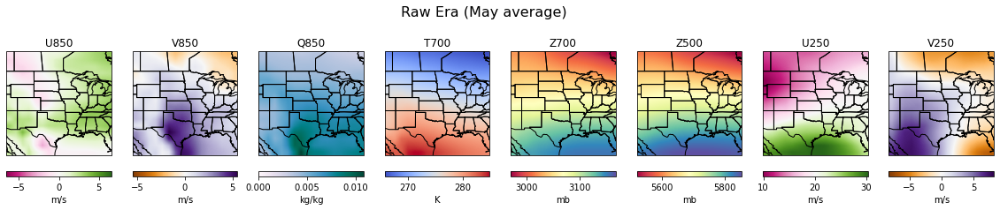

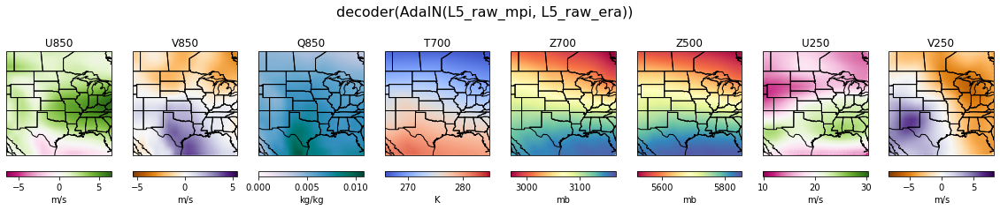

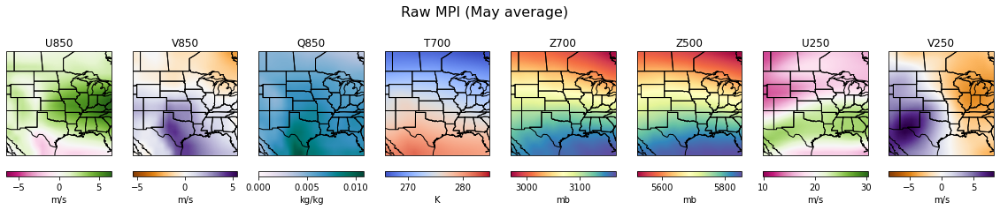

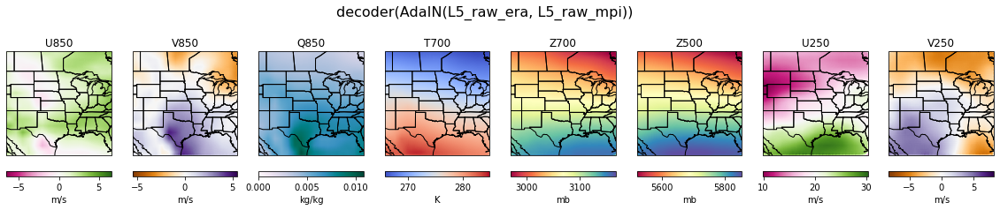

In [44]:
# abs plots

# autoscale
#vmin = [min(era[ii].min(),mpi[ii].min(),raw_mpi[ii].min(),raw_era[ii].min()) for ii in range(15)]
#vmax = [max(era[ii].max(),mpi[ii].max(),raw_mpi[ii].max(),raw_era[ii].max()) for ii in range(15)]
vmin = [min(raw_mpi[ii].min(),raw_era[ii].min()) for ii in range(16)]
vmax = [max(raw_mpi[ii].max(),raw_era[ii].max()) for ii in range(16)]

# vmin = [min(mpi[ii].min(),era[ii].min()) for ii in range(16)]
# vmax = [max(mpi[ii].max(),era[ii].max()) for ii in range(16)]


print(vmin[0:0+8], vmax[0:0+8])
plot_8v_abs(raw_era, 'Raw Era (May average)', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs(era, 'decoder(AdaIN(L5_raw_mpi, L5_raw_era))', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs(raw_mpi, 'Raw MPI (May average)', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs(mpi, 'decoder(AdaIN(L5_raw_era, L5_raw_mpi))', vmin[0:0+8], vmax[0:0+8], cc=False)


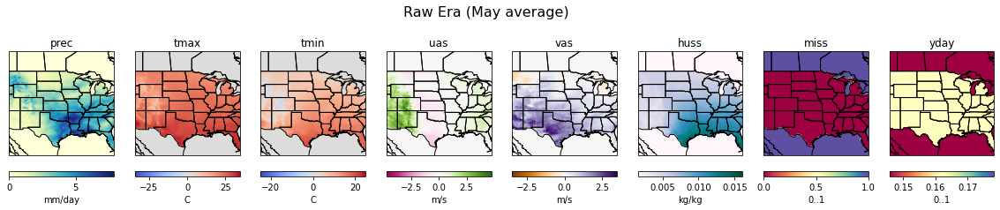

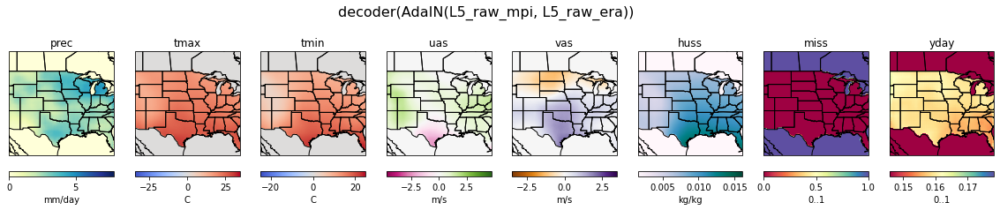

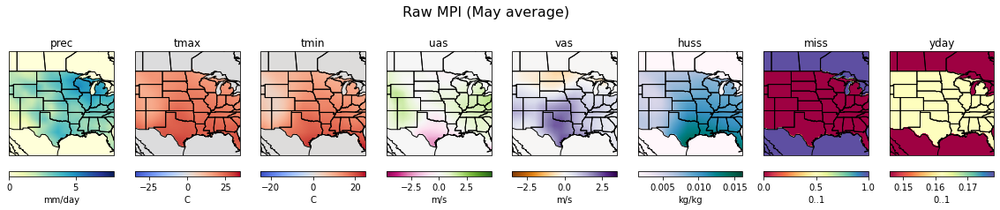

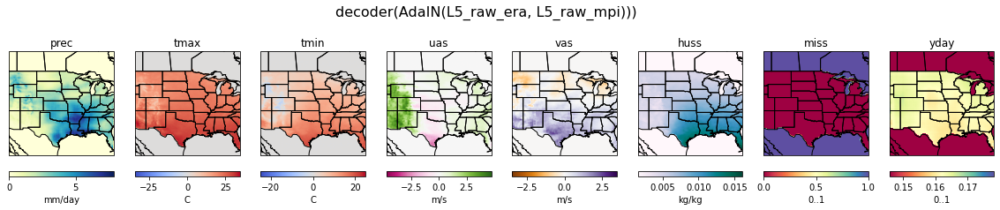

In [45]:
# surf
plot_8v_abs_surf(raw_era, 'Raw Era (May average)', vmin, vmax, cc=False)
plot_8v_abs_surf(era, 'decoder(AdaIN(L5_raw_mpi, L5_raw_era))', vmin, vmax, cc=False)
plot_8v_abs_surf(raw_mpi, 'Raw MPI (May average)', vmin, vmax, cc=False)
plot_8v_abs_surf(mpi, 'decoder(AdaIN(L5_raw_era, L5_raw_mpi)))', vmin, vmax, cc=False)


<a id='ma'></a>
## Do all 12 months

In [47]:
from IPython.display import display, HTML

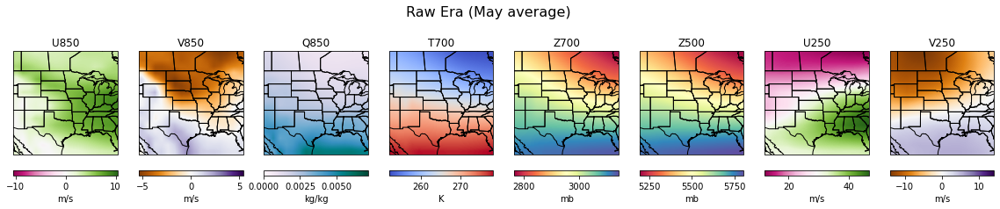

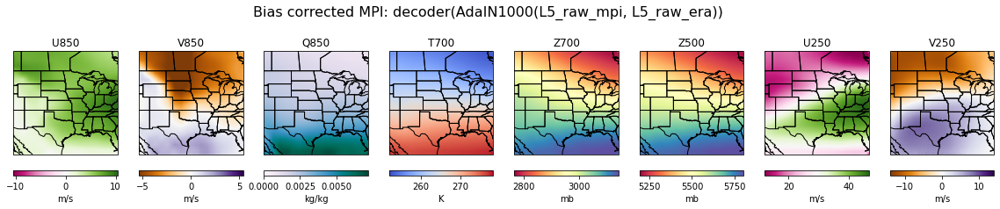

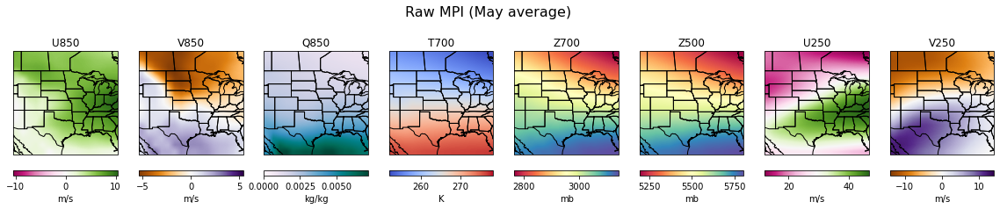

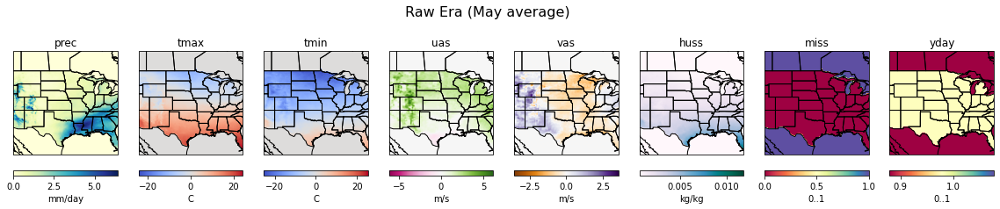

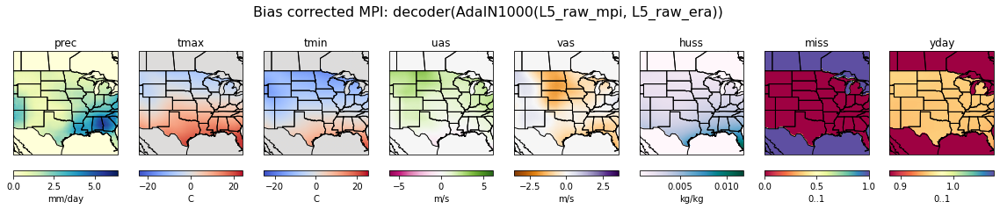

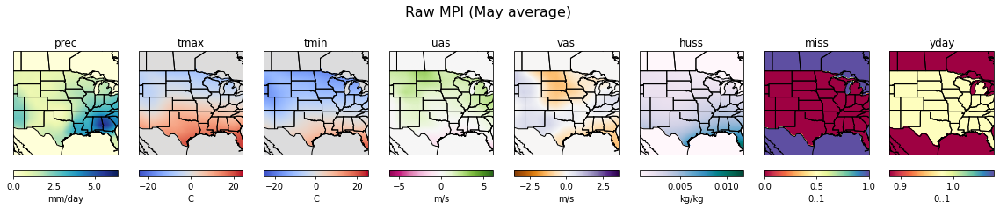

KeyboardInterrupt: 

In [48]:
month_names = ['January','February','March','April', 'May',     'June',  'July',   'August', 'September','October','November','December']
month_days = [(0,30),    (31,58),   (59,89),(90,119),(120,150),(151,180),(181,211),(212,242),(243,272), (273,303),(304,333), (334,364)]
for mname, (doy_start, doy_end) in zip(month_names, month_days):
    #print(mname, doy_start, doy_end)
    display(HTML('<hr style="height:2px"><h1>{} (doy: {}-{})</h1>'.format(mname, doy_start, doy_end)))

    raw_era, raw_mpi, era, mpi = calc_month_average(doy_start, doy_end)
    
    # autoscale
    vmin = [min(raw_mpi[ii].min(),raw_era[ii].min()) for ii in range(16)]
    vmax = [max(raw_mpi[ii].max(),raw_era[ii].max()) for ii in range(16)]

    # UATM
    plot_8v_abs(raw_era, 'Raw Era (May average)', vmin[0:0+8], vmax[0:0+8], cc=False)
    plot_8v_abs(era, 'Bias corrected MPI: decoder(AdaIN1000(L5_raw_mpi, L5_raw_era))', vmin[0:0+8], vmax[0:0+8], cc=False)
    plot_8v_abs(raw_mpi, 'Raw MPI (May average)', vmin[0:0+8], vmax[0:0+8], cc=False)
    #plot_8v_abs(mpi, 'decoder(AdaIN(L5_raw_era, L5_raw_mpi))', vmin[0:0+8], vmax[0:0+8], cc=False)
    
    # surf
    plot_8v_abs_surf(raw_era, 'Raw Era (May average)', vmin, vmax, cc=False)
    plot_8v_abs_surf(era, 'Bias corrected MPI: decoder(AdaIN1000(L5_raw_mpi, L5_raw_era))', vmin, vmax, cc=False)
    plot_8v_abs_surf(raw_mpi, 'Raw MPI (May average)', vmin, vmax, cc=False)
    #plot_8v_abs_surf(mpi, 'decoder(AdaIN(L5_raw_era, L5_raw_mpi)))', vmin, vmax, cc=False)


    

<a id='sd'></a>
## Single Day

torch.Size([16, 128, 128])


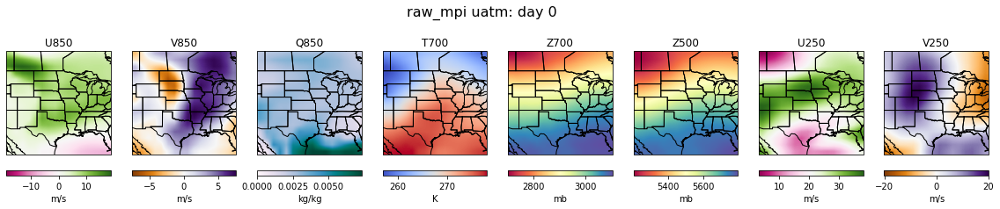

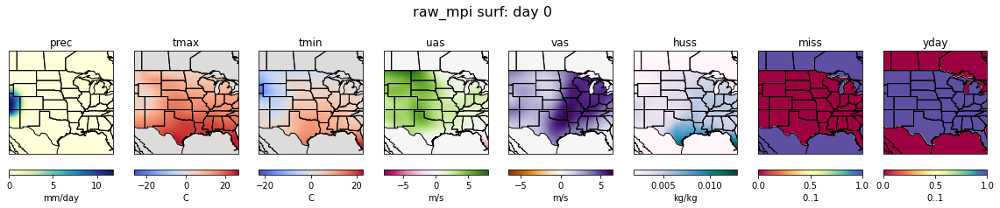

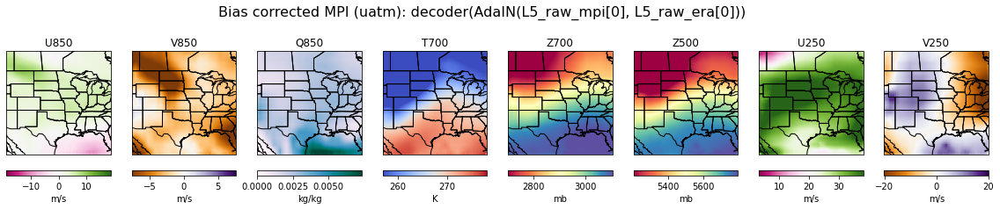

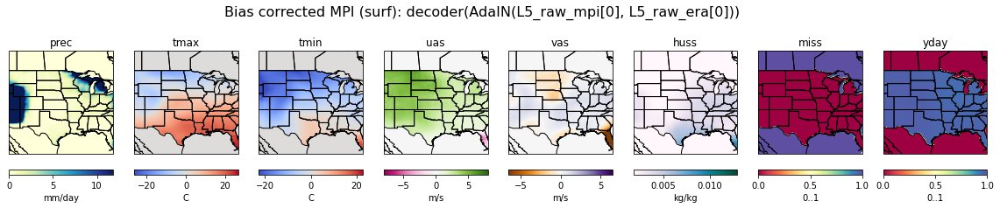

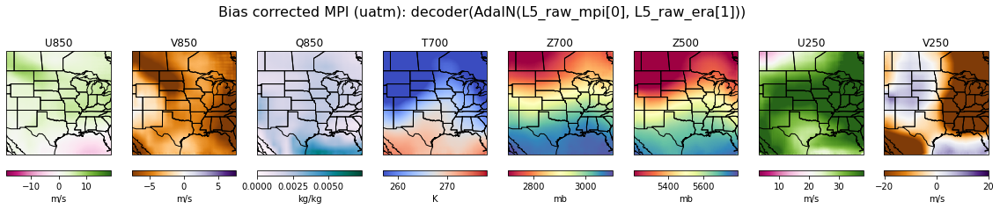

...

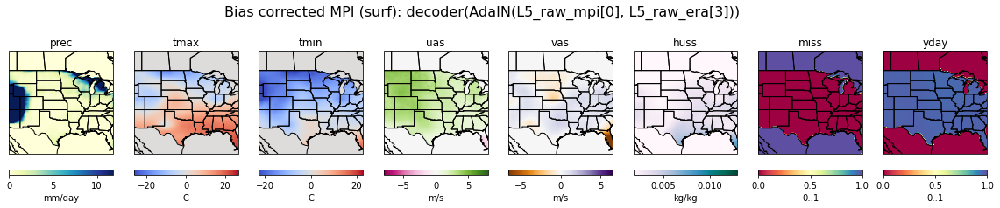

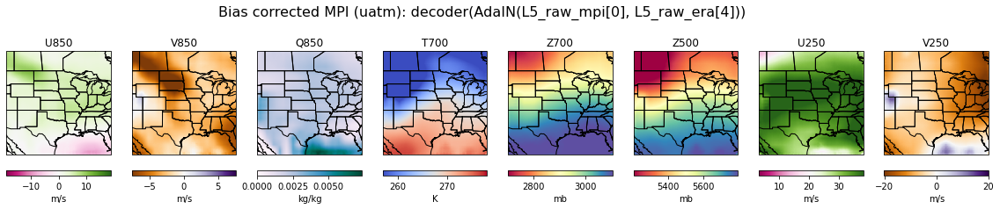

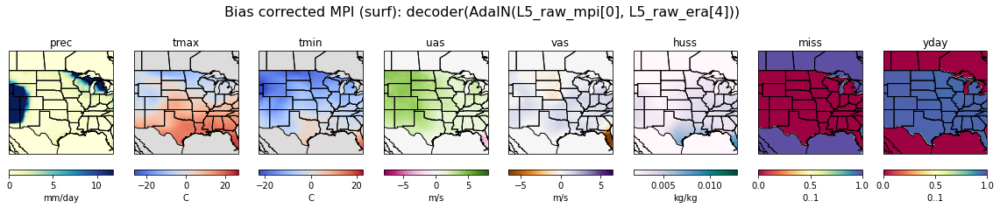

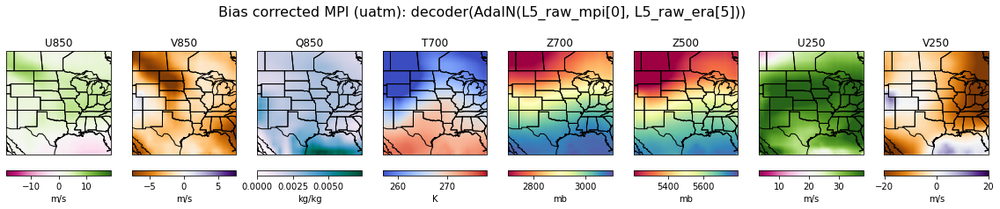

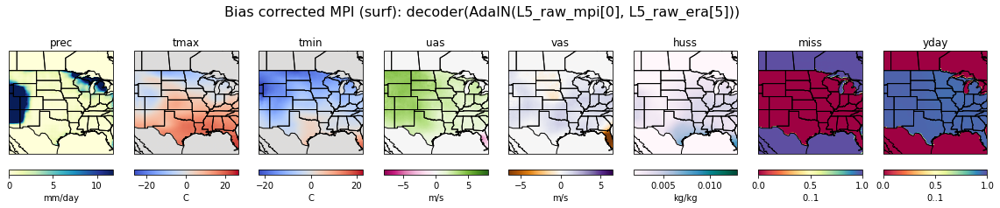

In [278]:
# plot single day before and after
ii = 0
input_era = np.array(samples_era[ii:ii+mb]) 
input_mpi = np.array(samples_mpi[ii:ii+mb])

# ground truth
mpi_denorm = input_mpi * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]
print(input_img_denorm[0].shape)

vmin = [mpi_denorm[0][ii].min() for ii in range(16)]
vmax = [mpi_denorm[0][ii].max() for ii in range(16)]
vmin[15] = 0
vmax[15] = 1

plot_8v_abs(mpi_denorm[0], 'raw_mpi uatm: day %s' % (ii), vmin, vmax, cc=False)
plot_8v_abs_surf(mpi_denorm[0], 'raw_mpi surf: day %s' % (ii), vmin, vmax, cc=False)


# extrapolation
#for jj in [0,60,120,180,240,300]:
for jj in [0,1,2,3,4,5]:
    input_mpi = samples_mpi[ii:ii+mb]
    input_era = samples_era[jj:jj+mb]

    #generated_img = general_encoder.forward2(general_encoder(input_mpi))
    generated_img = general_encoder.forward2(AdaIN(general_encoder(input_mpi), general_encoder(input_era)))#.data.cpu()
    #generated_img = general_encoder.forward2(AdaIN(general_encoder(generated_img), general_encoder(input_era)))#.data.cpu()
    generated_img = generated_img.detach() * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_img = np.array(generated_img)

    # UATM
    display(HTML('<hr style="height:1px">'))
    plot_8v_abs(generated_img[0], 'Bias corrected MPI (uatm): decoder(AdaIN(L5_raw_mpi[%s], L5_raw_era[%s]))' % (ii,jj), vmin, vmax, cc=False)
    # surf
    plot_8v_abs_surf(generated_img[0], 'Bias corrected MPI (surf): decoder(AdaIN(L5_raw_mpi[%s], L5_raw_era[%s]))' % (ii,jj), vmin, vmax, cc=False)


<a id='vgg16'></a>
## VGG16: Look at individual day vs. approximation

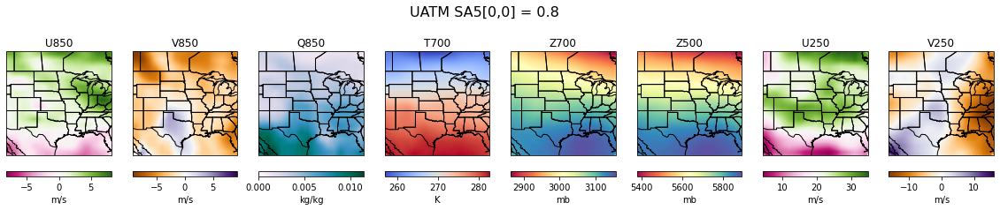

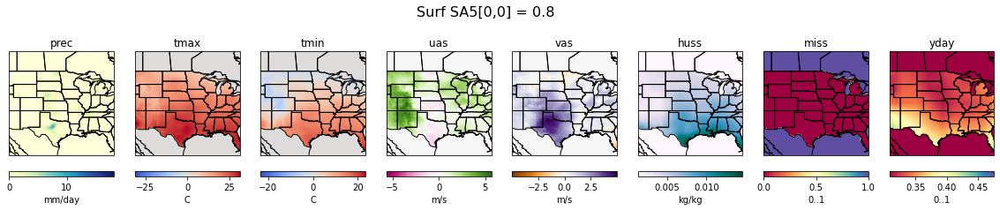

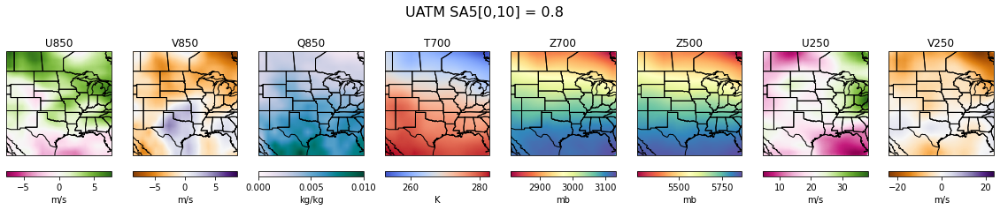

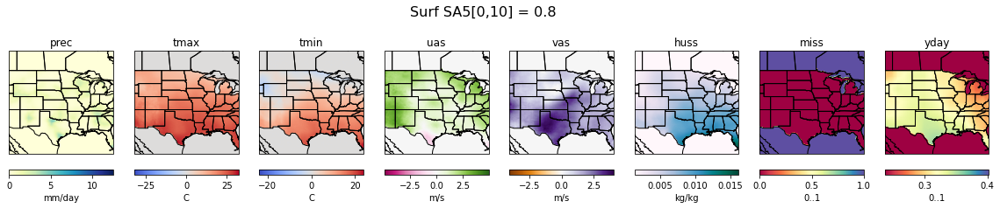

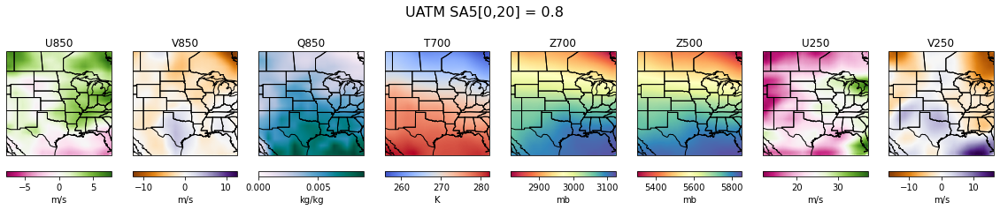

...

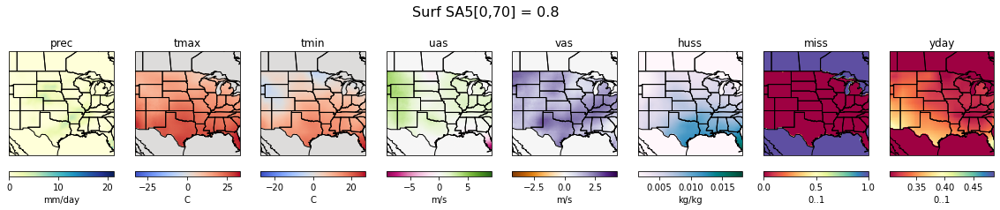

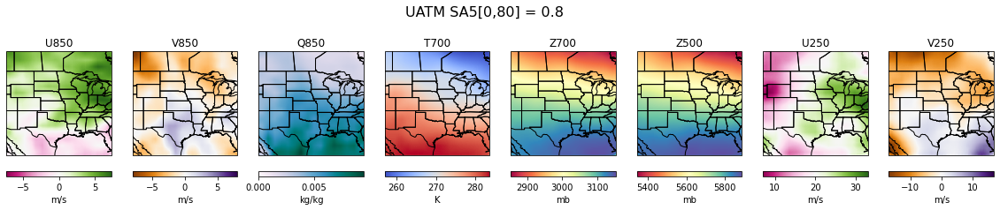

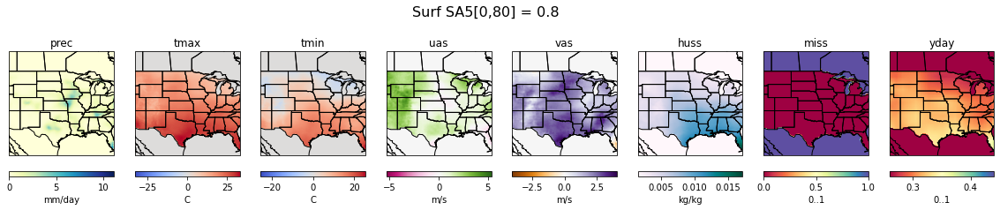

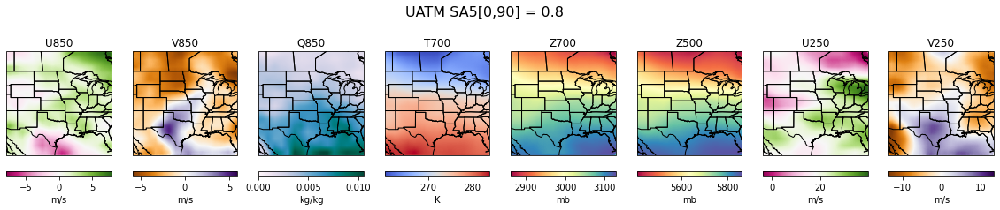

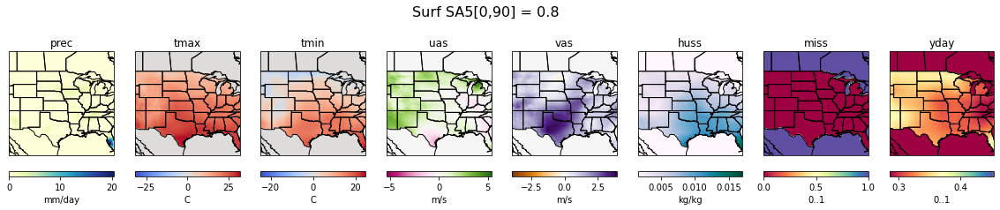

In [142]:
# vgg16 decoder
for ii in range(0,100,10):
    SA5 = torch.zeros((1, 1000))
    SA5[0,ii] = 0.8

    generated_img = np.array(vgg_decoder(SA5).detach())
    generated_img = generated_img * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]


    generated_img = generated_img[0]
    vmin = [generated_img[ii].min() for ii in range(16)]
    vmax = [generated_img[ii].max() for ii in range(16)]
    plot_8v_abs(generated_img, 'UATM SA5[0,%s] = 0.8' % (ii), vmin[0:0+8], vmax[0:0+8], cc=False)
    plot_8v_abs_surf(generated_img, 'Surf SA5[0,%s] = 0.8' % (ii), vmin, vmax, cc=False)
    print()


<a id='sfa'></a>
## Single filter activations

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


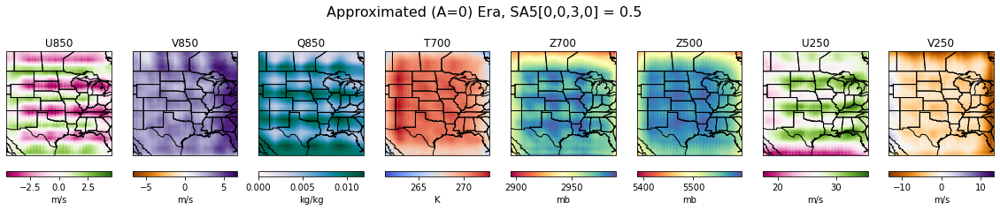

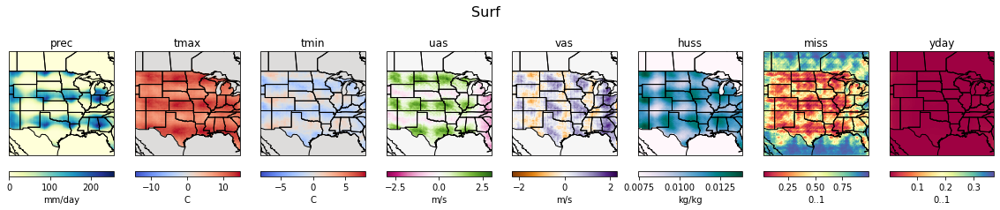

In [143]:
# construct synthetic bottleneck activation
SA5 = torch.zeros((1, 16, 4, 4))

for ii in range(4):
    for jj in range(4):
        SA5[0,15,ii,jj] = 0.8
        # SA5[0,1,3,0] = 0.8
        # SA5[0,2,3,1] = 0.8
        # SA5[0,3,3,2] = 0.8
        # SA5[0,4,3,2] = 0.8
        # SA5[0,5,0,2] = 0.8


# generated_img = np.array(mpi2mpi_decoder(SA5).detach())
# generated_img = generated_img * (minmaxi_mpi[:,1]-minmaxi_mpi[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_mpi[:,0][np.newaxis,:,np.newaxis,np.newaxis]

generated_img = np.array(general_encoder.forward2(SA5).detach())
generated_img = generated_img * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]


generated_img = generated_img[0]
vmin = [generated_img[ii].min() for ii in range(16)]
vmax = [generated_img[ii].max() for ii in range(16)]
plot_8v_abs(generated_img, 'Approximated (A=0) Era, SA5[0,0,3,0] = 0.5', vmin[0:0+8], vmax[0:0+8], cc=False)
plot_8v_abs_surf(generated_img, 'Surf', vmin, vmax, cc=False)


In [173]:
list(mpi2mpi_encoder.conv55.parameters())[2].shape

torch.Size([2048, 1024, 4, 4])

In [185]:
mpi2mpi_encoder.conv55[1].weight.shape

torch.Size([2048, 1024, 4, 4])

In [189]:
#F.conv_transpose2d(h, weight=self.encoder[0].weight.transpose(0, 1), bias=self.bias[0], stride=2, padding=1)
l1 = F.conv_transpose2d(SA5, weight=mpi2mpi_encoder.conv55[1].weight.transpose(2,3), bias=None, stride=2,padding=1)
l1.shape
    

torch.Size([1, 1024, 8, 8])

#### Backprop experiements

<a id='ssim'></a>
## SSIM: match MPI to closest Era

In [39]:
ss = np.load('/glade/scratch/dkorytin/ssim_closest_mpi2era.npy')

In [ ]:
ss2 = np.load('/glade/scratch/dkorytin/ssim_closest_mpi2era_bak.npy')

In [38]:
#np.save('/glade/scratch/dkorytin/ssim_closest_mpi2era_bak.npy', ss)

In [40]:
ss.shape

(20454, 5, 2)

In [41]:
np.where(ss==0)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [35]:
ss[0,:,:] = np.zeros((5,2))
                     

In [341]:
ss[0,:,:].shape

(5, 2)

In [353]:
sorted(ss[0,:,0].tolist()) 

[0.0, 0.0, 0.0, 0.0, 0.0]

In [38]:
sss = np.array([sorted(ss[ii,:,:].tolist(),reverse=True) for ii in range(len(ss))])

In [39]:
sss.shape

(20454, 5, 2)

In [345]:
sss[2]

array([[8.80994618e-01, 5.84500000e+03],
       [8.79074156e-01, 5.51000000e+03],
       [8.77080858e-01, 6.26800000e+03],
       [8.73486340e-01, 8.80300000e+03],
       [8.71814609e-01, 6.25100000e+03]])

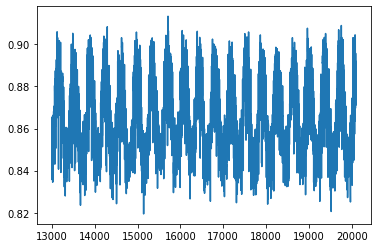

In [231]:
#plt.rcParams["figure.figsize"] = (20,3)
plt.plot(range(13000,20100), ss[13000:20100,4,0])

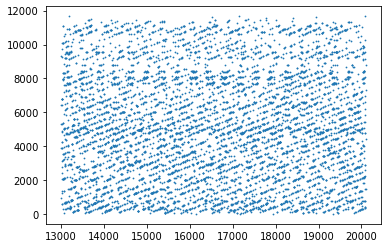

In [230]:
plt.scatter(range(13000,20100), ss[13000:20100,0,1], s=.6)


In [246]:
[1,2,3][-1]


3

In [ ]:
# example day
ii = 0


In [46]:
sss[10592][0]

array([8.90662611e-01, 9.49300000e+03])

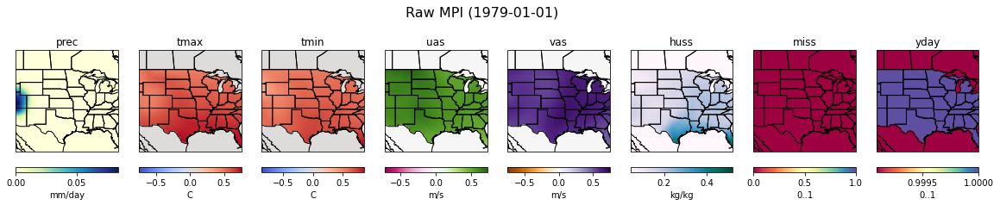

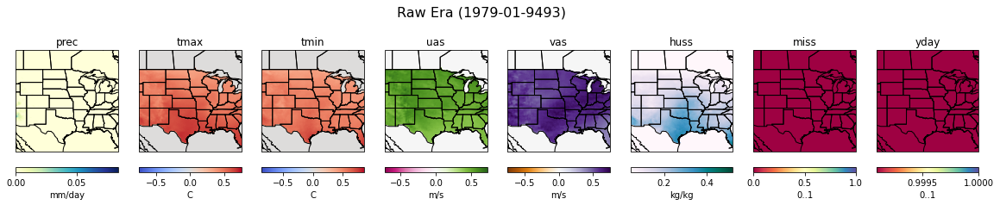

In [53]:
input_mpi = samples_mpi[0]
input_era = samples_era[9493]
vmin = [min(input_mpi[ii].min(),input_era[ii].min()) for ii in range(16)]
vmax = [max(input_mpi[ii].max(),input_era[ii].max()) for ii in range(16)]

plot_8v_abs_surf(np.array(input_mpi), 'Raw MPI (1979-01-01)', vmin, vmax, cc=False)
plot_8v_abs_surf(np.array(input_era), 'Raw Era (1979-01-9493)', vmin, vmax, cc=False)


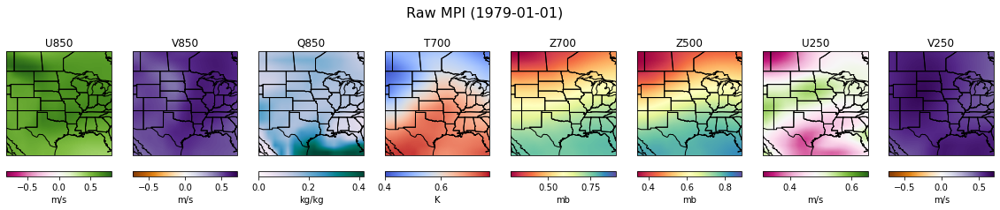

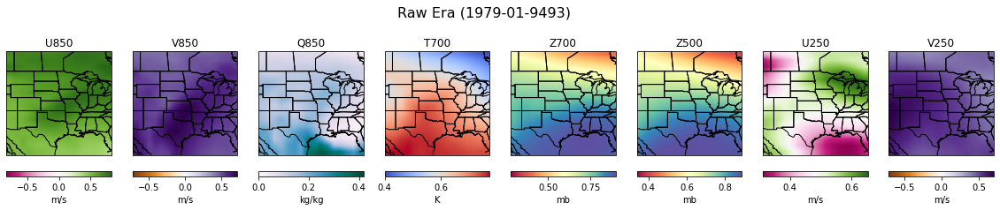

In [54]:
plot_8v_abs(np.array(input_mpi), 'Raw MPI (1979-01-01)', vmin, vmax, cc=False)
plot_8v_abs(np.array(input_era), 'Raw Era (1979-01-9493)', vmin, vmax, cc=False)


### VGG16

In [354]:
import torchvision.models as models

ModuleNotFoundError: No module named 'torchvision'

In [180]:
def add_module(self,module):
    self.add_module(str(len(self) + 1 ), module)

torch.nn.Module.add = add_module


In [181]:
general_encoder = vgg16()
general_encoder.features[0] = nn.ConvTranspose2d(16, 64, 3, 1, 1)
general_encoder.features.add(nn.AdaptiveAvgPool2d(output_size=(7, 7)))

In [182]:
general_encoder

VGG(
  (features): Sequential(
    (0): ConvTranspose2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, 

In [183]:
x = torch.randn(1, 16, 128, 128)

In [184]:
A1 = general_encoder._modules['features'].forward(x)
#A2 = general_encoder._modules['avgpool'].forward(A1)
A1.shape

torch.Size([1, 512, 7, 7])

In [285]:
general_encoder.parameters


<bound method Module.parameters of GenerativeNet(
  (conv11): Sequential(
    (0): Conv2d(16, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv22): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv33): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv44): Sequential(
    (0): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv55): Sequential(
    (0): Conv2d(1024, 2048, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): Sigmoid()
  )
)>

In [185]:
general_encoder._modules

OrderedDict([('features',
              Sequential(
                (0): ConvTranspose2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
                (1): ReLU(inplace=True)
                (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
                (3): ReLU(inplace=True)
                (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
                (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
                (6): ReLU(inplace=True)
                (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
                (8): ReLU(inplace=True)
                (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
                (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
                (11): ReLU(inplace=True)
                (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
               

In [186]:
A1 = general_encoder._modules['features'].forward(x)
A1.shape

torch.Size([1, 512, 7, 7])

In [187]:
A2 = general_encoder._modules['classifier'].forward(A1)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (3584x7 and 25088x4096)

In [155]:
A1.shape

torch.Size([1, 512, 8, 8])

In [188]:
general_encoder(x)


tensor([[-4.3910e-02,  1.1274e-01,  1.1593e-02,  1.2321e-01, -8.4381e-02,
          4.4545e-02, -2.8154e-01,  3.0427e-03, -1.1749e-01, -1.0280e-01,
         -6.1537e-02, -3.5067e-02,  1.2734e-01, -7.6512e-02, -2.8276e-01,
          3.5774e-03,  5.1108e-02, -4.2130e-02,  2.1946e-01,  8.5180e-02,
          4.1378e-02,  2.4842e-01, -1.2877e-01,  8.0288e-03, -2.3867e-01,
         -1.0458e-01, -1.6942e-01, -2.9305e-02,  6.1546e-02,  2.1573e-01,
         -7.3488e-02,  4.1701e-02,  3.3520e-01,  4.6044e-01, -7.7976e-02,
          1.3651e-02,  1.3408e-01,  5.5298e-02,  2.2595e-01,  8.2408e-02,
         -1.7379e-03,  1.2503e-01, -3.4602e-02, -3.1717e-02,  9.0546e-02,
         -2.0776e-01, -2.4068e-01,  3.2912e-02,  2.9251e-02, -5.0699e-02,
         -2.3578e-02,  4.7845e-02, -2.3727e-01,  2.8228e-03, -2.6997e-01,
         -5.9685e-03,  1.4144e-01, -2.2486e-01,  9.7019e-02,  2.0183e-01,
         -1.6680e-01, -1.8347e-01, -1.9894e-01,  1.8743e-01, -1.4190e-01,
          2.9524e-02, -2.5654e-01,  1.

In [74]:
(x**2).shape

torch.Size([1, 16, 128, 128])

In [ ]:
F.conv_transpose2d(x, weight=mpi2mpi_encoder.conv55[1].weight.transpose(2,3), bias=None, stride=2,padding=1).shape

### Moran I

In [63]:
import pysal as ps


In [64]:
input_mpi.shape

torch.Size([16, 128, 128])

In [65]:
w=ps.weights.Rook.from_dataframe(input_mpi[0])

AttributeError: module 'pysal' has no attribute 'weights'

In [194]:
import geopandas as gps
#import pysal as ps
import pysal
# urban_data=gpd.read_file(gdf_file_path)
# w=ps.weights.Rook.from_dataframe(urban_data)
# mi=ps.Moran(urban_data.Attribute_1, w)

# print(mi.I)
# print(mi.EI)
# print(mi.p_sim)

In [195]:
w=pysal.lib.weights.lat2W(4,4)

In [224]:
y = np.ones((4,4))
y.shape

(4, 4)

In [225]:
list(w)


[(0, {4: 0.5, 1: 0.5}),
 (1, {0: 0.3333333333333333, 5: 0.3333333333333333, 2: 0.3333333333333333}),
 (2, {1: 0.3333333333333333, 6: 0.3333333333333333, 3: 0.3333333333333333}),
 (3, {2: 0.5, 7: 0.5}),
 (4, {0: 0.3333333333333333, 8: 0.3333333333333333, 5: 0.3333333333333333}),
 (5, {1: 0.25, 4: 0.25, 9: 0.25, 6: 0.25}),
 (6, {2: 0.25, 5: 0.25, 10: 0.25, 7: 0.25}),
 (7, {3: 0.3333333333333333, 6: 0.3333333333333333, 11: 0.3333333333333333}),
 (8, {4: 0.3333333333333333, 12: 0.3333333333333333, 9: 0.3333333333333333}),
 (9, {5: 0.25, 8: 0.25, 13: 0.25, 10: 0.25}),
 (10, {6: 0.25, 9: 0.25, 14: 0.25, 11: 0.25}),
 (11, {7: 0.3333333333333333, 10: 0.3333333333333333, 15: 0.3333333333333333}),
 (12, {8: 0.5, 13: 0.5}),
 (13, {9: 0.3333333333333333, 12: 0.3333333333333333, 14: 0.3333333333333333}),
 (14,
  {10: 0.3333333333333333, 13: 0.3333333333333333, 15: 0.3333333333333333}),
 (15, {11: 0.5, 14: 0.5})]

In [199]:
from pysal.viz.splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation


In [226]:
mi = pysal.explore.esda.Moran(y, w, two_tailed=False)

In [228]:
mi.I

nan

In [210]:
dir(pysal.explore.esda)

['G',
 'G_Local',
 'Gamma',
 'Geary',
 'Join_Counts',
 'Moran',
 'Moran_BV',
 'Moran_BV_matrix',
 'Moran_Local',
 'Moran_Local_BV',
 'Moran_Local_Rate',
 'Moran_Rate',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'gamma',
 'geary',
 'getisord',
 'join_counts',
 'moran',
 'smoothing',
 'tabular']